In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,r2_score

In [2]:
# Load the Datafrom CSV
df=pd.read_csv("/home/sathish/Downloads/restaurant_data.csv (2)")

In [3]:
df_cleaned = df.drop_duplicates()

In [4]:
df_cleaned.to_csv('cleaned_file.csv', index=False)

In [5]:
# Load the Datafrom CSV
df=pd.read_csv("/home/sathish/Downloads/cleaned_file.csv")


In [6]:
df

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
0,Restaurant 0,1,4,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,Yes,13,4,638945.52
1,Restaurant 1,0,5,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,Yes,48,6,490207.83
2,Restaurant 2,1,3,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,No,27,14,541368.62
3,Restaurant 3,1,3,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,Yes,9,17,404556.80
4,Restaurant 4,0,4,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,No,37,26,1491046.35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7852,Restaurant 8363,2,2,3.4,54,34.85,1102,11298,11,380,253.919515,9.5,5.0,Yes,37,0,434653.45
7853,Restaurant 8364,1,2,3.7,49,36.88,1988,20432,9,713,175.590195,2.7,2.6,No,37,21,414977.92
7854,Restaurant 8365,0,3,4.7,88,46.87,5949,63945,6,436,222.953647,4.8,1.7,Yes,83,21,930395.87
7855,Restaurant 8366,1,0,3.1,31,44.53,707,7170,1,729,178.482851,6.1,2.1,No,6,21,311493.48


In [7]:
df.head()

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
0,Restaurant 0,1,4,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,Yes,13,4,638945.52
1,Restaurant 1,0,5,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,Yes,48,6,490207.83
2,Restaurant 2,1,3,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,No,27,14,541368.62
3,Restaurant 3,1,3,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,Yes,9,17,404556.80
4,Restaurant 4,0,4,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,No,37,26,1491046.35


In [8]:
df.tail()

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
7852,Restaurant 8363,2,2,3.4,54,34.85,1102,11298,11,380,253.919515,9.5,5.0,Yes,37,0,434653.45
7853,Restaurant 8364,1,2,3.7,49,36.88,1988,20432,9,713,175.590195,2.7,2.6,No,37,21,414977.92
7854,Restaurant 8365,0,3,4.7,88,46.87,5949,63945,6,436,222.953647,4.8,1.7,Yes,83,21,930395.87
7855,Restaurant 8366,1,0,3.1,31,44.53,707,7170,1,729,178.482851,6.1,2.1,No,6,21,311493.48
7856,Restaurant 8367,1,4,4.0,33,71.07,2003,24268,8,197,151.838065,5.9,7.5,Yes,5,12,534142.98


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7857 entries, 0 to 7856
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Name                    7857 non-null   object 
 1   Location                7857 non-null   int64  
 2   Cuisine                 7857 non-null   int64  
 3   Rating                  7857 non-null   float64
 4   Seating Capacity        7857 non-null   int64  
 5   Average Meal Price      7857 non-null   float64
 6   Marketing Budget        7857 non-null   int64  
 7   Social Media Followers  7857 non-null   int64  
 8   Chef Experience Years   7857 non-null   int64  
 9   Number of Reviews       7857 non-null   int64  
 10  Avg Review Length       7857 non-null   float64
 11  Ambience Score          7857 non-null   float64
 12  Service Quality Score   7857 non-null   float64
 13  Parking Availability    7857 non-null   object 
 14  Weekend Reservations    7857 non-null   

In [10]:
df.shape

(7857, 17)

In [11]:
df.describe()

,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Weekend Reservations,Weekday Reservations,Revenue
count,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.000000,7857.00000,7.857000e+03
mean,1.060456,2.476518,3.979191,58.940817,47.852486,2916.721013,33111.280132,10.019600,523.714140,175.011092,5.523724,5.501133,28.903271,28.56841,6.411500e+05
std,0.803053,1.712759,0.579322,17.133831,14.342701,1419.869576,14498.554088,5.517873,277.278017,72.042658,2.577384,2.586237,19.677027,19.54151,2.611363e+05
min,0.000000,0.000000,3.000000,30.000000,25.000000,604.000000,5277.000000,1.000000,50.000000,50.011717,1.000000,1.000000,0.000000,0.00000,1.847085e+05
25%,0.000000,1.000000,3.500000,44.000000,35.480000,1829.000000,21960.000000,5.000000,278.000000,113.452725,3.300000,3.200000,13.000000,13.00000,4.456431e+05
50%,1.000000,2.000000,4.000000,58.000000,45.470000,2724.000000,31116.000000,10.000000,528.000000,174.302560,5.500000,5.600000,26.000000,26.00000,5.887752e+05
75%,2.000000,4.000000,4.500000,73.000000,60.160000,3711.000000,41543.000000,15.000000,766.000000,237.775438,7.800000,7.700000,42.000000,41.00000,7.933124e+05
max,2.000000,5.000000,5.000000,90.000000,76.000000,7164.000000,72355.000000,19.000000,999.000000,299.922469,10.000000,10.000000,88.000000,88.00000,1.531868e+06


In [12]:
x=df[['Rating','Seating Capacity','Weekend Reservations','Weekday Reservations']]

<Axes: >

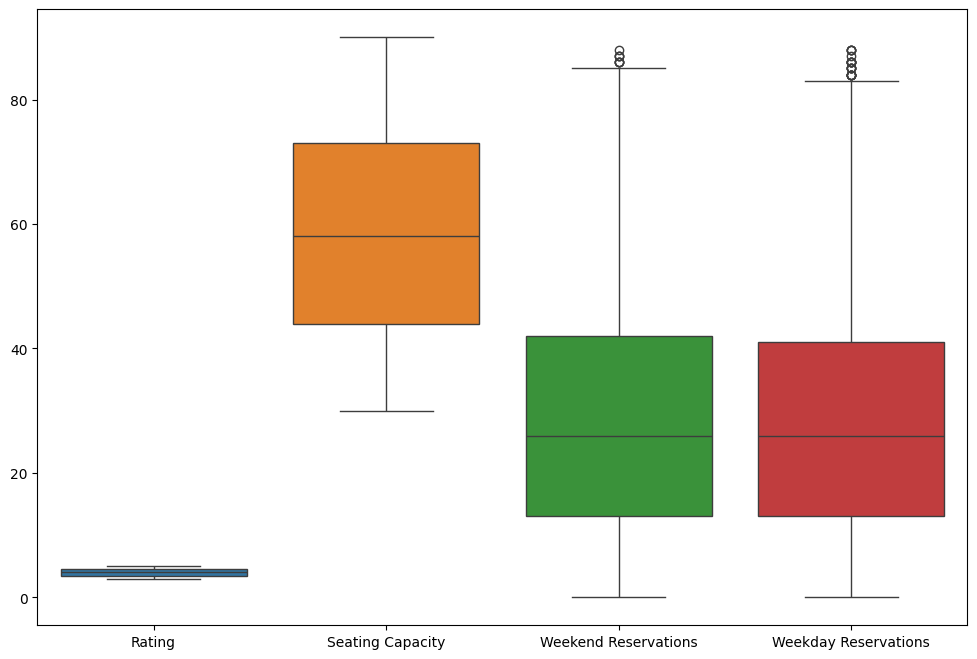

In [13]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(12,8))
sns.boxplot(x)

            

In [14]:
x1=df[['Marketing Budget','Social Media Followers']]

<Axes: >

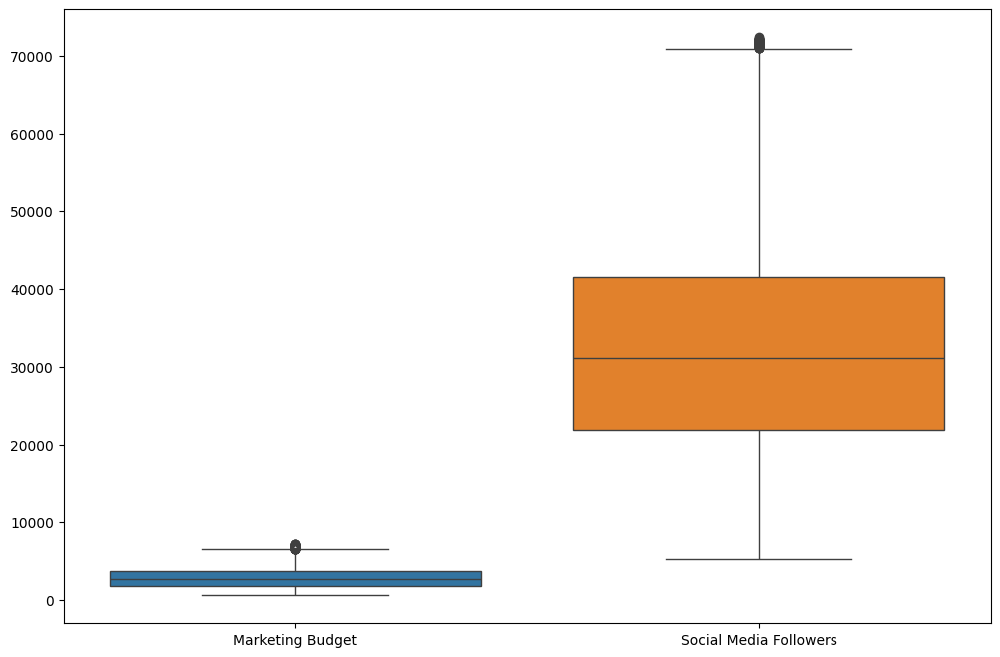

In [15]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(12,8))
sns.boxplot(x1)

        

In [16]:
feature=df[['Marketing Budget','Social Media Followers']]

In [17]:
def remove_outliers_iqr(df, feature):
    Q1=df[feature].quantile(0.25)
    Q3=df[feature].quantile(0.75)
    IQR=Q3-Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df [(df [feature] >= lower_bound) & (df[feature] <= upper_bound)]

In [18]:
df= remove_outliers_iqr(df,'Marketing Budget')

In [19]:
df= remove_outliers_iqr(df,'Social Media Followers')

In [20]:
df

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
0,Restaurant 0,1,4,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,Yes,13,4,638945.52
1,Restaurant 1,0,5,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,Yes,48,6,490207.83
2,Restaurant 2,1,3,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,No,27,14,541368.62
3,Restaurant 3,1,3,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,Yes,9,17,404556.80
4,Restaurant 4,0,4,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,No,37,26,1491046.35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7852,Restaurant 8363,2,2,3.4,54,34.85,1102,11298,11,380,253.919515,9.5,5.0,Yes,37,0,434653.45
7853,Restaurant 8364,1,2,3.7,49,36.88,1988,20432,9,713,175.590195,2.7,2.6,No,37,21,414977.92
7854,Restaurant 8365,0,3,4.7,88,46.87,5949,63945,6,436,222.953647,4.8,1.7,Yes,83,21,930395.87
7855,Restaurant 8366,1,0,3.1,31,44.53,707,7170,1,729,178.482851,6.1,2.1,No,6,21,311493.48


In [21]:
df.describe()

,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Weekend Reservations,Weekday Reservations,Revenue
count,7714.000000,7714.000000,7714.000000,7714.000000,7714.000000,7714.000000,7714.00000,7714.000000,7714.000000,7714.000000,7714.000000,7714.000000,7714.000000,7714.000000,7.714000e+03
mean,1.080114,2.476277,3.976173,58.551983,47.809156,2846.977444,32431.39344,10.013352,523.589059,175.124345,5.522051,5.496215,28.689266,28.384496,6.361068e+05
std,0.797254,1.713960,0.580441,17.028951,14.342953,1336.107856,13734.68891,5.516375,277.668230,72.021495,2.577027,2.586242,19.489658,19.411995,2.585173e+05
min,0.000000,0.000000,3.000000,30.000000,25.000000,604.000000,5277.00000,1.000000,50.000000,50.011717,1.000000,1.000000,0.000000,0.000000,1.847085e+05
25%,0.000000,1.000000,3.500000,44.000000,35.462500,1810.250000,21734.75000,5.000000,278.000000,113.521993,3.300000,3.200000,13.000000,13.000000,4.435815e+05
50%,1.000000,2.000000,4.000000,58.000000,45.400000,2690.500000,30739.00000,10.000000,528.000000,174.357769,5.500000,5.500000,26.000000,26.000000,5.847705e+05
75%,2.000000,4.000000,4.500000,72.000000,60.127500,3644.750000,40883.00000,15.000000,767.000000,237.784992,7.800000,7.700000,42.000000,41.000000,7.860932e+05
max,2.000000,5.000000,5.000000,90.000000,76.000000,6523.000000,69704.00000,19.000000,999.000000,299.922469,10.000000,10.000000,88.000000,88.000000,1.531868e+06


In [22]:
columns_to_impute=['Name','Location','Cuisine','Rating','Seating Capacity','Average Meal Price','Marketing Budget','Social Media Followers','Chef Experience Years','Number of Reviews','Avg Review Length','Ambience Score','Service Quality Score','Parking Availability','Weekend Reservations','Weekday Reservations','Revenue']
for i in columns_to_impute:
    print("how many unique value for ",i," : ",df[i].nunique())

how many unique value for  Name  :  7714
how many unique value for  Location  :  3
how many unique value for  Cuisine  :  6
how many unique value for  Rating  :  21
how many unique value for  Seating Capacity  :  61
how many unique value for  Average Meal Price  :  3842
how many unique value for  Marketing Budget  :  3817
how many unique value for  Social Media Followers  :  7155
how many unique value for  Chef Experience Years  :  19
how many unique value for  Number of Reviews  :  949
how many unique value for  Avg Review Length  :  7714
how many unique value for  Ambience Score  :  91
how many unique value for  Service Quality Score  :  91
how many unique value for  Parking Availability  :  2
how many unique value for  Weekend Reservations  :  89
how many unique value for  Weekday Reservations  :  89
how many unique value for  Revenue  :  7714


In [23]:
from sklearn.preprocessing import LabelEncoder
label_encoder=LabelEncoder()
df['Location'] = label_encoder.fit_transform(df['Location'])
df['Cuisine'] = label_encoder.fit_transform(df['Cuisine'])

In [24]:
df

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
0,Restaurant 0,1,4,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,Yes,13,4,638945.52
1,Restaurant 1,0,5,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,Yes,48,6,490207.83
2,Restaurant 2,1,3,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,No,27,14,541368.62
3,Restaurant 3,1,3,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,Yes,9,17,404556.80
4,Restaurant 4,0,4,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,No,37,26,1491046.35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7852,Restaurant 8363,2,2,3.4,54,34.85,1102,11298,11,380,253.919515,9.5,5.0,Yes,37,0,434653.45
7853,Restaurant 8364,1,2,3.7,49,36.88,1988,20432,9,713,175.590195,2.7,2.6,No,37,21,414977.92
7854,Restaurant 8365,0,3,4.7,88,46.87,5949,63945,6,436,222.953647,4.8,1.7,Yes,83,21,930395.87
7855,Restaurant 8366,1,0,3.1,31,44.53,707,7170,1,729,178.482851,6.1,2.1,No,6,21,311493.48


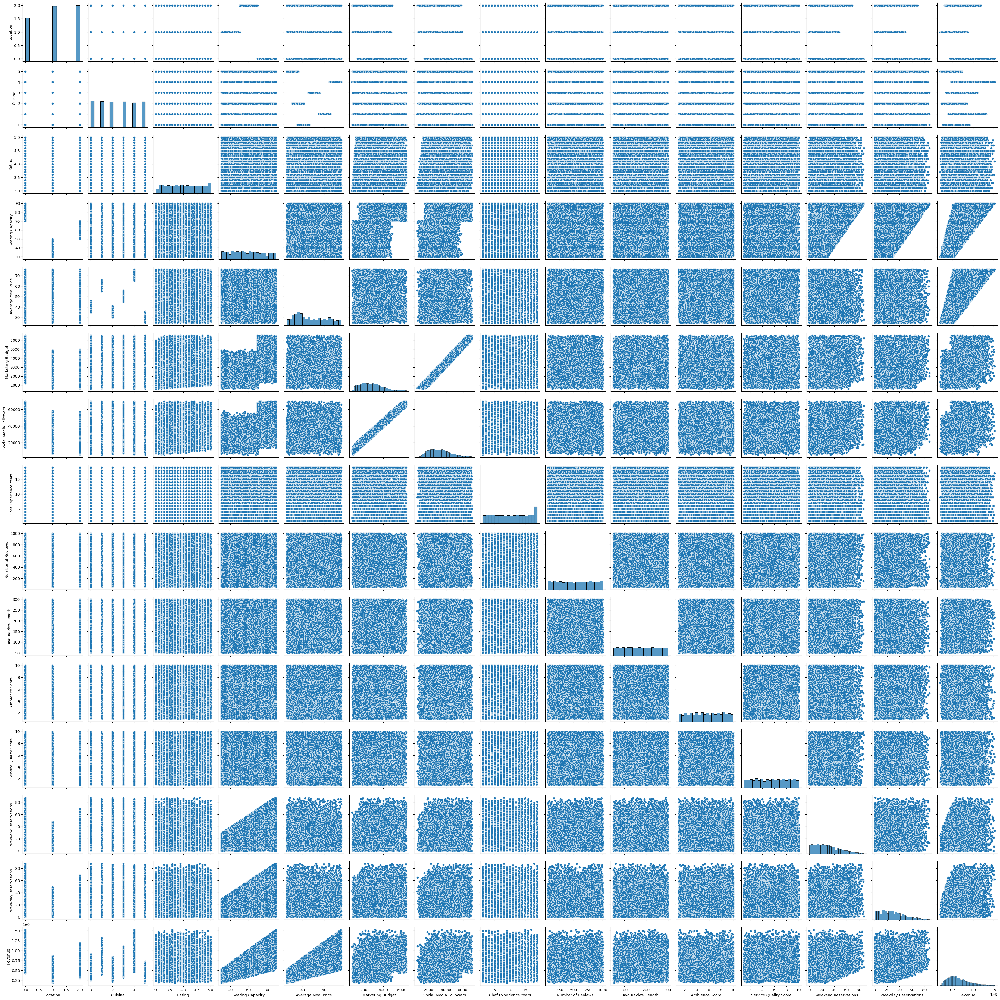

In [25]:
sns.pairplot(df)

In [26]:
df1=df[['Location','Cuisine','Rating','Seating Capacity','Average Meal Price','Marketing Budget','Social Media Followers','Chef Experience Years','Number of Reviews','Avg Review Length','Ambience Score','Service Quality Score','Weekend Reservations','Weekday Reservations','Revenue']]

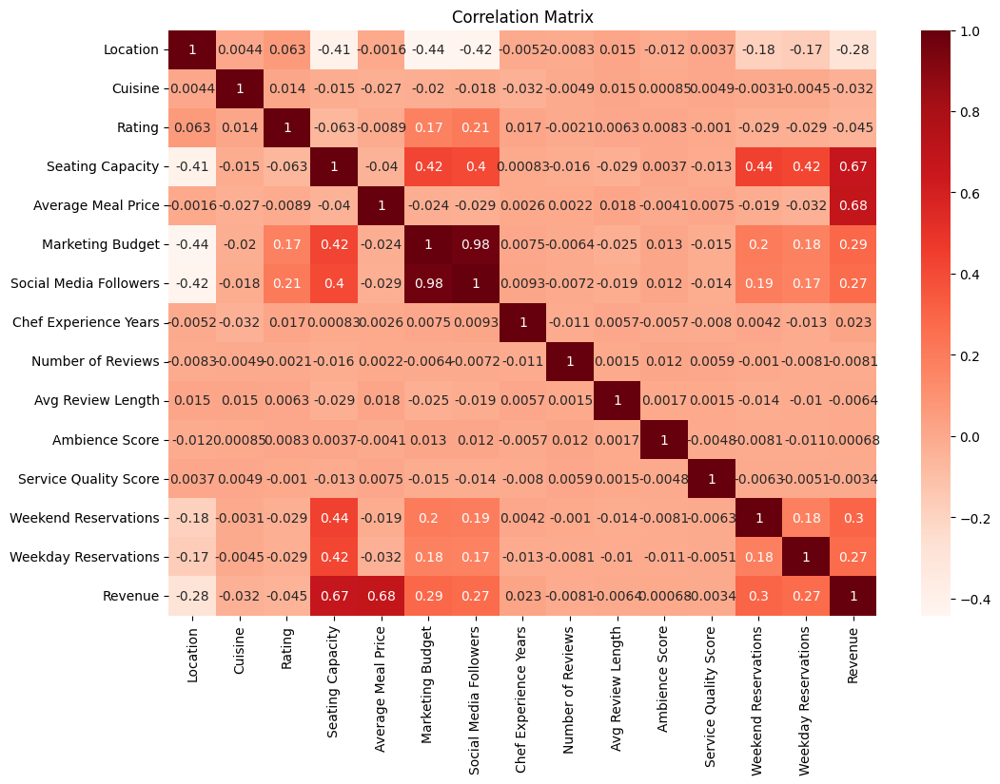

In [27]:
correlation_matrix=df1.corr()
plt.figure(figsize=(12,8))
sns.heatmap(correlation_matrix,annot=True, cmap='Reds')
plt.title("Correlation Matrix")
plt.show()

In [28]:
x=df1[['Rating','Seating Capacity','Marketing Budget','Social Media Followers','Chef Experience Years','Weekend Reservations','Weekday Reservations']]
y=df1['Revenue']


In [29]:
x

,Rating,Seating Capacity,Marketing Budget,Social Media Followers,Chef Experience Years,Weekend Reservations,Weekday Reservations
0,4.0,38,2224,23406,13,13,4
1,3.2,76,4416,42741,8,48,6
2,4.7,48,2796,37285,18,27,14
3,4.4,34,1167,15214,13,9,17
4,4.9,88,3639,40171,9,37,26
...,...,...,...,...,...,...,...
7852,3.4,54,1102,11298,11,37,0
7853,3.7,49,1988,20432,9,37,21
7854,4.7,88,5949,63945,6,83,21
7855,3.1,31,707,7170,1,6,21


In [30]:
y

0        638945.52
1        490207.83
2        541368.62
3        404556.80
4       1491046.35
           ...    
7852     434653.45
7853     414977.92
7854     930395.87
7855     311493.48
7856     534142.98
Name: Revenue, Length: 7714, dtype: float64

In [31]:
# splitting the dataset into training and testing sets
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [32]:
x_train

,Rating,Seating Capacity,Marketing Budget,Social Media Followers,Chef Experience Years,Weekend Reservations,Weekday Reservations
767,3.3,62,3145,37825,2,36,33
295,3.8,66,1940,23254,14,5,53
6012,4.6,66,3254,32939,6,3,46
1572,4.8,66,1276,13294,9,0,63
7736,3.1,73,1874,26833,10,13,18
...,...,...,...,...,...,...,...
5326,4.6,61,1822,21680,1,28,19
5493,4.6,32,1898,20181,3,30,7
874,5.0,38,3500,39025,2,32,10
7745,4.1,57,1681,20320,6,13,33


In [33]:
y_train

767     376617.89
295     861872.38
6012    753344.72
1572    462448.75
7736    709520.27
          ...    
5326    980797.16
5493    281632.10
874     319183.41
7745    442233.25
7403    625811.12
Name: Revenue, Length: 6171, dtype: float64

In [34]:
# building the linear regression model
model1=LinearRegression()

#fitting the model on the training data
model1.fit(x_train,y_train)

LinearRegression()

In [35]:
# model evaluation
y_pred=model1.predict(x_test)

In [37]:
y_pred_train=model1.predict(x_train)

In [38]:
y_pred

array([711009.28488324, 681115.05156095, 564268.37589909, ...,
       552420.65146407, 555302.80616904, 372209.53196066])

In [39]:
y_pred_train

array([660156.46764625, 709507.45952616, 703460.31855005, ...,
       421625.65853798, 614864.8850585 , 752707.58851854])

In [40]:
len(x_test)

1543

In [41]:
len(y_pred)

1543

In [42]:
#mean squared error and R-squared for model evaluation
mse=mean_squared_error(y_test,y_pred)
r2=r2_score(y_test,y_pred)

In [43]:
r2

0.4672343744390335

In [44]:
print("Mean Squred Error :",mse)
print("R-squared:",r2)

Mean Squred Error : 37314447867.179245
R-squared: 0.4672343744390335


In [46]:
# mean squred error and r-squared for model evaluation
mse1=mean_squared_error(y_train,y_pred_train)
r3=r2_score(y_train,y_pred_train)
print("Mean squared error :",mse1)
print("R_squared",r3)

Mean squared error : 36381060820.3679
R_squared 0.4489239458059856


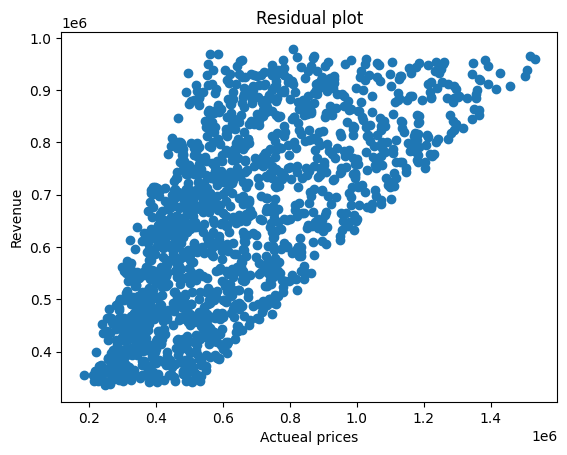

In [47]:
# predicttion and visualization 
# to visualize the prediction against actual prices weell use a scatter plot
plt.scatter(y_test,y_pred)
plt.xlabel("Actueal prices")
plt.ylabel("Revenue")
plt.title("Residual plot")
plt.show()

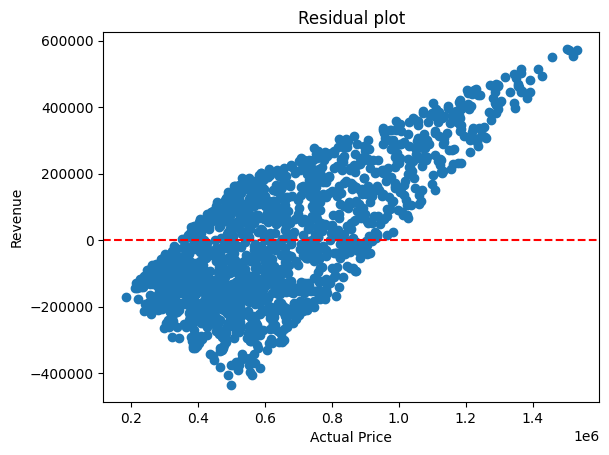

In [48]:
residual=y_test-y_pred
plt.scatter(y_test,residual)
plt.axhline(y=0,color='red',linestyle='--')
plt.xlabel("Actual Price")
plt.ylabel("Revenue")
plt.title("Residual plot")
plt.show()

In [49]:
# lastly, lets use the trained model to make predictions on new data and visualize the results
new_data=[[3.3,62,3145,37825,2,36,33]]
predicted_price=model1.predict(new_data)
print("predicted price:",predicted_price[0])

predicted price: 660156.4676462488


/home/sathish/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [50]:
# lastly, lets use the trained model to make predictions on new data and visualize the results
new_data1=[[4.6,61,1822,21680,1,28,19]]
predicted_price=model1.predict(new_data1)
print("predicted price:",predicted_price[0])


predicted price: 655229.1115476689


/home/sathish/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [51]:
from sklearn.metrics import mean_absolute_error

In [53]:
mae=mean_absolute_error(y_test,y_pred)
print('Test MAE is : ',mae)

Test MAE is :  160898.97190823854


In [54]:
mae1=mean_absolute_error(y_train,y_pred_train)
print('Train MAE is : ',mae1)

Train MAE is :  160091.39002611148


In [55]:
g=df1['Revenue'].mean()

In [56]:
MAE=mae/g*100
MAE

25.294332457450537

In [57]:
import numpy as np

In [58]:
mse=mean_squared_error(y_test,y_pred)
print('The MSE is : ',mse)

The MSE is :  37314447867.179245


In [59]:
rmse=np.sqrt(mean_squared_error(y_test,y_pred))
print('The RMSE is : ',rmse)

The RMSE is :  193169.4796472239


In [60]:
rmse1=np.sqrt(mean_squared_error(y_train,y_pred_train))
print('The RMSE is : ',rmse1)

The RMSE is :  190738.19968838937


In [61]:
x1=df[['Rating','Seating Capacity','Average Meal Price','Marketing Budget']]
y1=df['Revenue']


In [35]:
x1

,Rating,Seating Capacity,Average Meal Price,Marketing Budget
0,4.0,38,73.98,2224
1,3.2,76,28.11,4416
2,4.7,48,48.29,2796
3,4.4,34,51.55,1167
4,4.9,88,75.98,3639
...,...,...,...,...
7852,3.4,54,34.85,1102
7853,3.7,49,36.88,1988
7854,4.7,88,46.87,5949
7855,3.1,31,44.53,707


In [36]:
y1

0        638945.52
1        490207.83
2        541368.62
3        404556.80
4       1491046.35
           ...    
7852     434653.45
7853     414977.92
7854     930395.87
7855     311493.48
7856     534142.98
Name: Revenue, Length: 7857, dtype: float64

In [37]:
# splitting the dataset into training and testing sets
x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,test_size=0.2,random_state=42)

In [38]:
x1_train

,Rating,Seating Capacity,Average Meal Price,Marketing Budget
6162,3.9,49,42.51,994
432,4.4,34,51.69,3054
7192,4.9,59,37.73,4191
3026,3.1,72,30.88,3581
3518,3.2,30,54.91,2031
...,...,...,...,...
5226,4.0,62,40.76,3555
5390,3.7,70,68.28,1873
860,4.2,50,45.01,973
7603,3.5,86,59.44,5166


In [39]:
y1_train

6162     472789.72
432      400220.71
7192     518045.63
3026     508660.83
3518     386971.55
           ...    
5226     567999.07
5390    1067155.72
860      509194.15
7603    1154390.20
7270     600486.95
Name: Revenue, Length: 6285, dtype: float64

In [40]:
# building the linear regression model
model2=LinearRegression()

#fitting the model on the training data
model2.fit(x1_train,y1_train)

LinearRegression()

In [41]:
# model evaluation
y1_pred=model2.predict(x1_test)

In [65]:
y2_pred=model2.predict(x1_train)

In [66]:
y2_pred

array([ 463784.68352769,  426757.72175057,  515096.43143661, ...,
        507145.604786  , 1081019.64001594,  697351.5332608 ])

In [69]:
y1_train

6162     472789.72
432      400220.71
7192     518045.63
3026     508660.83
3518     386971.55
           ...    
5226     567999.07
5390    1067155.72
860      509194.15
7603    1154390.20
7270     600486.95
Name: Revenue, Length: 6285, dtype: float64

In [70]:
#mean squared error and R-squared for model evaluation
#mse=mean_squared_error(y1_test,y2_pred)
r21=r2_score(y1_train,y2_pred)

In [71]:
r21

0.9572281290062835

In [42]:
y1_pred

array([ 592217.65733806,  611572.20289502,  153257.72617042, ...,
        475130.755781  ,  946741.95460905, 1159097.23543978])

In [43]:
#mean squared error and R-squared for model evaluation
mse=mean_squared_error(y1_test,y1_pred)
r2=r2_score(y1_test,y1_pred)

In [44]:
r2

0.9552721931674077

In [45]:
# mean squred error and r-squared for model evaluation
mse1=mean_squared_error(y1_test,y1_pred)
r3=r2_score(y1_test,y1_pred)
print("Mean squared error :",mse1)
print("R_squared",r3)

Mean squared error : 2979784568.2502522
R_squared 0.9552721931674077


In [46]:
n=len(y1_test)
k=x1_test.shape[1]
adjusted_r21=1-(1-r2)*(n-1)/(n-k-1)
print('The adjusted R2 is : ',adjusted_r21)

The adjusted R2 is :  0.9551580188040827


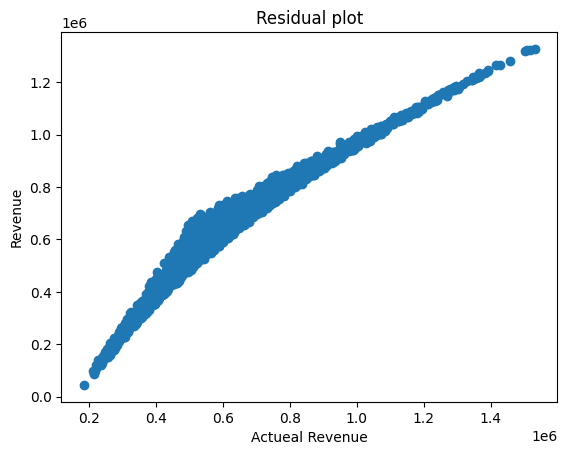

In [292]:
# predicttion and visualization 
# to visualize the prediction against actual prices weell use a scatter plot
plt.scatter(y1_test,y1_pred)
plt.xlabel("Actueal Revenue")
plt.ylabel("Revenue")
plt.title("Residual plot")
plt.show()

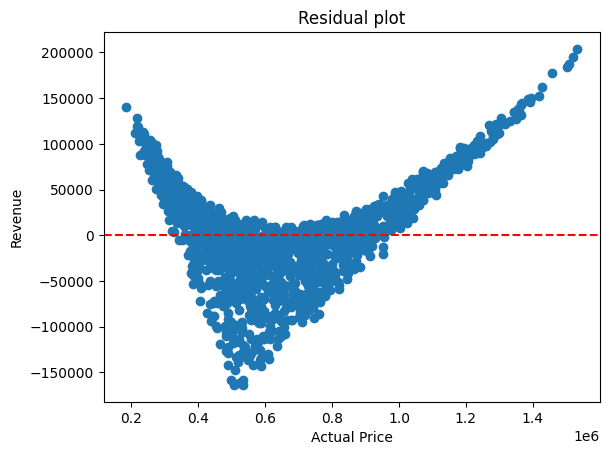

In [293]:
residual=y1_test-y1_pred
plt.scatter(y1_test,residual)
plt.axhline(y=0,color='red',linestyle='--')
plt.xlabel("Actual Price")
plt.ylabel("Revenue")
plt.title("Residual plot")
plt.show()

In [296]:
# lastly, lets use the trained model to make predictions on new data and visualize the results
new_data=[[4.3,80,60.8,4726]]
predicted_price=model2.predict(new_data)
print("predicted price:",predicted_price[0])

predicted price: 1031563.8448866805


/home/sathish/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [297]:
# lastly, lets use the trained model to make predictions on new data and visualize the results
new_data=[[3.3,62,26.62,3145]]
predicted_price=model2.predict(new_data)
print("predicted price:",predicted_price[0])

predicted price: 400806.07667110744


/home/sathish/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [298]:
# lastly, lets use the trained model to make predictions on new data and visualize the results
new_data=[[4.6,61,72.36,1822]]
predicted_price=model2.predict(new_data)
print("predicted price:",predicted_price[0])


predicted price: 975567.0616578093


/home/sathish/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [299]:
from sklearn.metrics import mean_absolute_error

In [300]:
mae1=mean_absolute_error(y1_test,y1_pred)
print('The MAE is : ',mae1)

The MAE is :  41240.52100677391


In [301]:
g=df1['Revenue'].mean()

In [302]:
g

636106.8123813845

In [303]:
MAE=mae1/g*100
MAE

6.4832698226233925

In [304]:
import numpy as np

In [305]:
mse1=mean_squared_error(y1_test,y1_pred)
print('The MSE is : ',mse1)

The MSE is :  2988827814.739533


In [306]:
rmse1=np.sqrt(mean_squared_error(y1_test,y1_pred))
print('The RMSE is : ',rmse1)

The RMSE is :  54670.17298984459


In [1]:
from sklearn.metrics import mean_squared_error,r2_score

In [18]:
df['Parking Availability'] = label_encoder.fit_transform(df['Parking Availability'])

In [19]:
x2=df[['Location','Cuisine','Rating','Seating Capacity','Average Meal Price','Marketing Budget','Social Media Followers','Chef Experience Years','Number of Reviews','Avg Review Length','Ambience Score','Service Quality Score','Parking Availability','Weekend Reservations','Weekday Reservations',]]
y2=df['Revenue']

In [20]:
x2

,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations
0,1,4,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,1,13,4
1,0,5,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,1,48,6
2,1,3,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,0,27,14
3,1,3,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,1,9,17
4,0,4,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,0,37,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7852,2,2,3.4,54,34.85,1102,11298,11,380,253.919515,9.5,5.0,1,37,0
7853,1,2,3.7,49,36.88,1988,20432,9,713,175.590195,2.7,2.6,0,37,21
7854,0,3,4.7,88,46.87,5949,63945,6,436,222.953647,4.8,1.7,1,83,21
7855,1,0,3.1,31,44.53,707,7170,1,729,178.482851,6.1,2.1,0,6,21


In [21]:
y2

0        638945.52
1        490207.83
2        541368.62
3        404556.80
4       1491046.35
           ...    
7852     434653.45
7853     414977.92
7854     930395.87
7855     311493.48
7856     534142.98
Name: Revenue, Length: 7857, dtype: float64

In [22]:
# splitting the dataset into training and testing sets
x2_train,x2_test,y2_train,y2_test=train_test_split(x2,y2,test_size=0.2,random_state=42)

In [23]:
x2_train

,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations
6162,1,0,3.9,49,42.51,994,15787,7,402,252.419879,3.2,5.1,0,41,15
432,1,3,4.4,34,51.69,3054,37666,2,325,232.781714,2.1,5.9,1,30,13
7192,2,2,4.9,59,37.73,4191,50866,16,535,262.128238,2.0,3.5,0,44,6
3026,0,5,3.1,72,30.88,3581,42633,10,257,196.464664,2.2,2.6,1,2,41
3518,1,3,3.2,30,54.91,2031,27010,15,272,203.306456,7.1,1.6,1,20,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5226,2,0,4.0,62,40.76,3555,34653,2,662,157.600735,5.4,1.8,1,11,3
5390,2,4,3.7,70,68.28,1873,20962,6,435,243.322143,9.9,2.8,0,36,13
860,1,0,4.2,50,45.01,973,17514,8,562,64.686284,2.0,3.7,0,44,1
7603,0,1,3.5,86,59.44,5166,57176,11,482,102.750755,2.1,4.6,1,74,77


In [24]:
y2_train

6162     472789.72
432      400220.71
7192     518045.63
3026     508660.83
3518     386971.55
           ...    
5226     567999.07
5390    1067155.72
860      509194.15
7603    1154390.20
7270     600486.95
Name: Revenue, Length: 6285, dtype: float64

In [25]:
# building the linear regression model
model3=LinearRegression()

#fitting the model on the training data
model3.fit(x2_train,y2_train)

LinearRegression()

In [26]:
# model evaluation
y2_pred=model3.predict(x2_test)

In [27]:
y2_pred

array([ 591155.27157843,  607170.07052189,  156491.38588806, ...,
        476305.14071052,  949778.54060872, 1153919.62515437])

In [28]:
#mean squared error and R-squared for model evaluation
mse2=mean_squared_error(y2_test,y2_pred)
r4=r2_score(y2_test,y2_pred)

In [30]:
print(mse2)
print(r4)

2965418484.930672
0.9554878340585331


In [33]:
n=len(y2_test)
k=x2_test.shape[1]
adjusted_r2=1-(1-r4)*(n-1)/(n-k-1)
print('The adjusted R2 is : ',adjusted_r2)

The adjusted R2 is :  0.9550587322017708


In [47]:
#R_squared 0.9573263223381551
#The adjusted R2 is :  0.9551580188040827

In [49]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [53]:
ridge=Ridge()
parameter=[{'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,50]}]
ridge_regressor=GridSearchCV(ridge,parameter,scoring='neg_mean_squared_error',cv=5)
ridge_regressor.fit(x1_train,y1_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid=[{'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                    20, 30, 50]}],
             scoring='neg_mean_squared_error')

In [64]:
x1_train

,Rating,Seating Capacity,Average Meal Price,Marketing Budget
6162,3.9,49,42.51,994
432,4.4,34,51.69,3054
7192,4.9,59,37.73,4191
3026,3.1,72,30.88,3581
3518,3.2,30,54.91,2031
...,...,...,...,...
5226,4.0,62,40.76,3555
5390,3.7,70,68.28,1873
860,4.2,50,45.01,973
7603,3.5,86,59.44,5166


In [54]:
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

{'alpha': 50}
-2942553191.296555


In [55]:
y1_pred=ridge_regressor.predict(x1_test)
from sklearn.metrics import r2_score
r2_score1=r2_score(y1_test,y1_pred)
print(r2_score1)

0.9552722900065105


In [56]:
ridge=Ridge(alpha=1e-10)
ridge.fit(x1,y1)

Ridge(alpha=1e-10)

In [61]:
y1_train_pred_ridge=ridge.predict(x1_train)
y1_test_pred_ridge=ridge.predict(x1_test)

In [62]:
print(y1_train_pred_ridge)
print(y1_test_pred_ridge)

[ 463664.3828902   426988.94225123  514835.0417138  ...  507025.00537705
 1080311.99992542  696525.47467925]
[ 592168.66951833  610979.44686651  153252.50001232 ...  474540.43968817
  946564.61837018 1158385.51036398]


In [63]:
print('Ridge Regression')
print('Training set R2 : ',r2_score(y1_train,y1_train_pred_ridge))
print('Test set R2 :',r2_score(y1_test,y1_test_pred_ridge))
print('Test set MSE : ',mean_squared_error(y1_test,y1_test_pred_ridge))

Ridge Regression
Training set R2 :  0.9572256494857331
Test set R2 : 0.9552951952265683
Test set MSE :  2978252161.7725368


In [73]:
#mean squared error and R-squared for model evaluation
#mse=mean_squared_error(y1_test,y2_pred)
r21=r2_score(y1_train,y2_pred)
#0.9572281290062835
r21

0.9572281290062835